![](https://visualrsoftware.com/wp-content/uploads/Data-Visualization.jpg)

# Contenido


1.   Imports
2.   Matplotlib
3.   Seaborn
   * Diagrama de barras
   * Diagrama de puntos
   * Joint Plot
   * Gráfico circular
   * Gráfico KDE
   * Gráfico de violíin
   * Mapa de calor
   * Gráfico de cajas
   * Swarm Plot(Gráfico de enjambre)
   * Múltiples gráficos






4.  Plotly
   * Gráfico de línea
   * Diagrama de dispersión
   * Gráfico de barras
   * Gráfico circular
   * Gráfico de burbujas
   * Histograma
   * Gráfico de cajas
   * Múltiples gráficos de dispersión
   * Inset Plot
   * Diagrama de dispersión 3D
   * Múltiples gráficos

# Instalación

    pipenv install matplotlib
    pipenv install seaborn
    pipenv install plotly

# Imports

In [1]:
import numpy as np
import pandas as pd
import plotly.plotly as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
py.sign_in('username', 'apikey')
init_notebook_mode(connected=True)

In [2]:
timesData = pd.read_csv("data/timesData.csv")
geo_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')
median_house_hold_in_come = pd.read_csv('data/MedianHouseholdIncome2015.csv', encoding="windows-1252")
percentage_people_below_poverty_level = pd.read_csv('data/PercentagePeopleBelowPovertyLevel.csv', encoding="windows-1252")
percent_over_25_completed_highSchool = pd.read_csv('data/PercentOver25CompletedHighSchool.csv', encoding="windows-1252")
share_race_city = pd.read_csv('data/ShareRaceByCity.csv', encoding="windows-1252")
kill = pd.read_csv('data/PoliceKillingsUS.csv', encoding="windows-1252")
data = pd.read_csv('data/pokemon.csv')
app = pd.read_csv('data/app_store_transformed.csv', index_col=0)
app.head()

,Id,App,Reviews,Rating,Current Version,Category,Type,Size,Price,Content Rating
1,281656475,PAC-MAN Premium,21292,4.0,6.3.5,Games,Paid,96.1M,3.99$,Everyone
2,281796108,Evernote - stay organized,161065,4.0,8.2.2,Productivity,Free,151.2M,0.0$,Everyone
3,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",188583,3.5,5.0.0,Weather,Free,95.9M,0.0$,Everyone
4,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",262241,4.0,5.10.0,Shopping,Free,122.6M,0.0$,Everyone 12+
5,282935706,Bible,985920,4.5,7.5.1,Reference,Free,88.5M,0.0$,Everyone


# Google Colab

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

# MATPLOTLIB
Matplotlib es una librería de visualización de gráficas. Con ella se pueden mostrar gráficas complejas para sacar conclusiones sobre nuestros datos. Se suele usar junto a la librería Seaborn para facilitar la creación de estas gráficas

## Repartición de valores

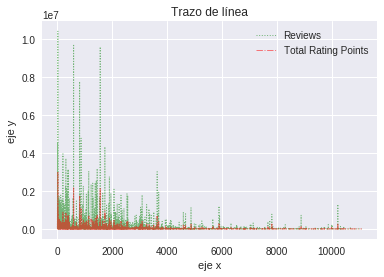

In [4]:
app['Total Rating Points'] = app.Rating * app.Reviews
app['Total Rating Points'].plot(kind = 'line', color = 'g',label = 'Reviews',linewidth=1,alpha = 0.5,grid = True,linestyle = ':')
app.Reviews.plot(color = 'r',label = 'Total Rating Points',linewidth=1, alpha = 0.5,grid = True,linestyle = '-.')
plt.legend(loc='upper right')  
plt.xlabel('eje x')
plt.ylabel('eje y')
plt.title('Trazo de línea')
plt.show()

# Ejercicios

Realizar un gráfico para ver la repartición de valores distintas en dos o tres columnas de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico de dispersión

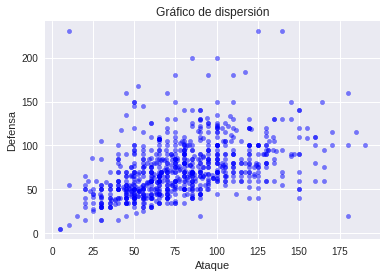

In [5]:
data.plot(kind='scatter', x='Attack', y='Defense',alpha = 0.5,color = 'blue')
plt.xlabel('Ataque')
plt.ylabel('Defensa')
plt.title('Gráfico de dispersión');

## Histograma

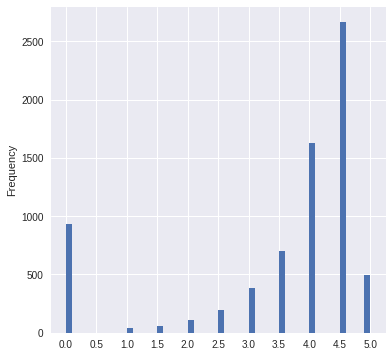

In [6]:
ar = app.Rating.plot(kind='hist', bins=50, figsize=(6,6)) # bins: Número de barras en el histograma
x_ticks = np.arange(0, 5.5, 0.5) # Valores en el eje x
ar.set_xticks(x_ticks)
plt.show()

# Ejercicios

Realizar un histograma de cualquier dataframe

In [ ]:
# Escriba su código aquí

# Seaborn

## Diagrama de barras

Text(0.5, 1.0, 'Diagrama de barras')

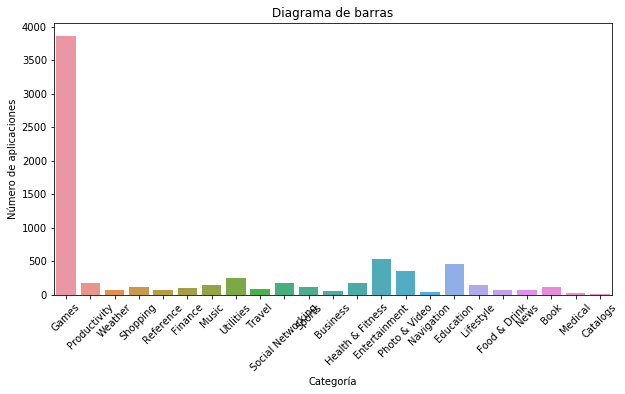

In [28]:
plt.figure(figsize=(10,5))
sns.countplot(x='Category', data=app)
plt.xticks(rotation= 45) # Rotación del texto en el eje x
plt.xlabel('Categoría')
plt.ylabel('Número de aplicaciones')
plt.title('Diagrama de barras')

In [29]:
share_race_city.replace(['-'],0.0,inplace = True)
share_race_city.replace(['(X)'],0.0,inplace = True)
share_race_city.loc[:,['share_white','share_black','share_native_american','share_asian','share_hispanic']] = share_race_city.loc[:,['share_white','share_black','share_native_american','share_asian','share_hispanic']].astype(float)
area_list = list(share_race_city['Geographic area'].unique())
share_white = []
share_black = []
share_native_american = []
share_asian = []
share_hispanic = []
for i in area_list:
    x = share_race_city[share_race_city['Geographic area']==i]
    share_white.append(sum(x.share_white)/len(x))
    share_black.append(sum(x.share_black) / len(x))
    share_native_american.append(sum(x.share_native_american) / len(x))
    share_asian.append(sum(x.share_asian) / len(x))
    share_hispanic.append(sum(x.share_hispanic) / len(x))

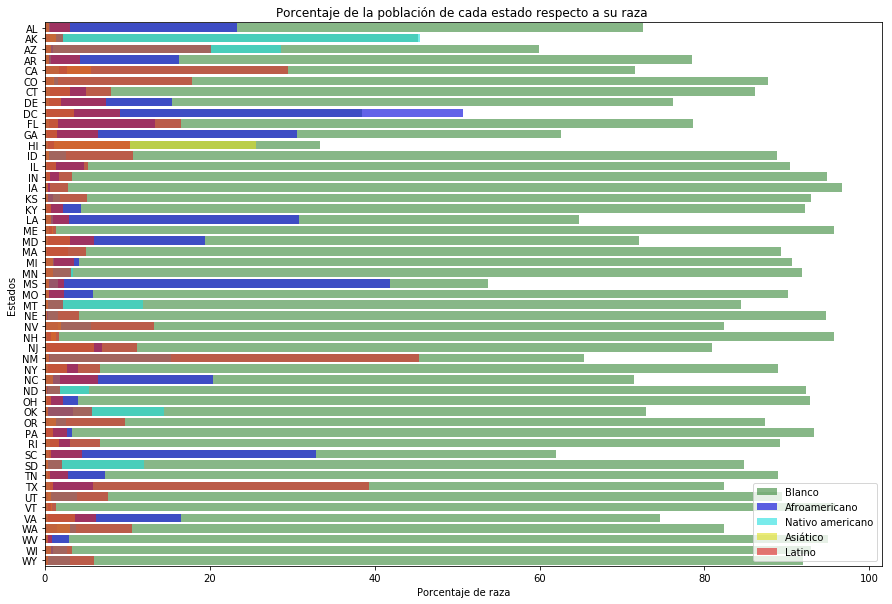

In [30]:
f,ax = plt.subplots(figsize = (15,10))
sns.barplot(x=share_white,y=area_list,color='green',alpha = 0.5,label='Blanco' )
sns.barplot(x=share_black,y=area_list,color='blue',alpha = 0.7,label='Afroamericano')
sns.barplot(x=share_native_american,y=area_list,color='cyan',alpha = 0.6,label='Nativo americano')
sns.barplot(x=share_asian,y=area_list,color='yellow',alpha = 0.6,label='Asiático')
sns.barplot(x=share_hispanic,y=area_list,color='red',alpha = 0.6,label='Latino')

ax.legend(loc='lower right',frameon = True)
ax.set(xlabel='Porcentaje de raza', ylabel='Estados',title = "Porcentaje de la población de cada estado respecto a su raza ");

# Ejercicios

Realizar un diagrama de barras de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Diagrama de puntos

In [31]:
percentage_people_below_poverty_level.poverty_rate.replace(['-'],0.0,inplace = True)
percentage_people_below_poverty_level.poverty_rate = percentage_people_below_poverty_level.poverty_rate.astype(float)
area_list = list(percentage_people_below_poverty_level['Geographic Area'].unique())
area_poverty_ratio = []
for i in area_list:
    x = percentage_people_below_poverty_level[percentage_people_below_poverty_level['Geographic Area']==i]
    area_poverty_rate = sum(x.poverty_rate)/len(x)
    area_poverty_ratio.append(area_poverty_rate)
data = pd.DataFrame({'area_list': area_list,'area_poverty_ratio':area_poverty_ratio})
new_index = (data['area_poverty_ratio'].sort_values(ascending=False)).index.values
sorted_data = data.reindex(new_index)

In [32]:
percent_over_25_completed_highSchool.percent_completed_hs.replace(['-'],0.0,inplace = True)
percent_over_25_completed_highSchool.percent_completed_hs = percent_over_25_completed_highSchool.percent_completed_hs.astype(float)
area_list = list(percent_over_25_completed_highSchool['Geographic Area'].unique())
area_highschool = []
for i in area_list:
    x = percent_over_25_completed_highSchool[percent_over_25_completed_highSchool['Geographic Area']==i]
    area_highschool_rate = sum(x.percent_completed_hs)/len(x)
    area_highschool.append(area_highschool_rate)

In [33]:
data = pd.DataFrame({'area_list': area_list,'area_highschool_ratio':area_highschool})
new_index = (data['area_highschool_ratio'].sort_values(ascending=True)).index.values
sorted_data2 = data.reindex(new_index)
sorted_data['area_poverty_ratio'] = sorted_data['area_poverty_ratio']/max(sorted_data['area_poverty_ratio'])
sorted_data2['area_highschool_ratio'] = sorted_data2['area_highschool_ratio']/max( sorted_data2['area_highschool_ratio'])
data = pd.concat([sorted_data,sorted_data2['area_highschool_ratio']],axis=1)
data.sort_values('area_poverty_ratio',inplace=True)

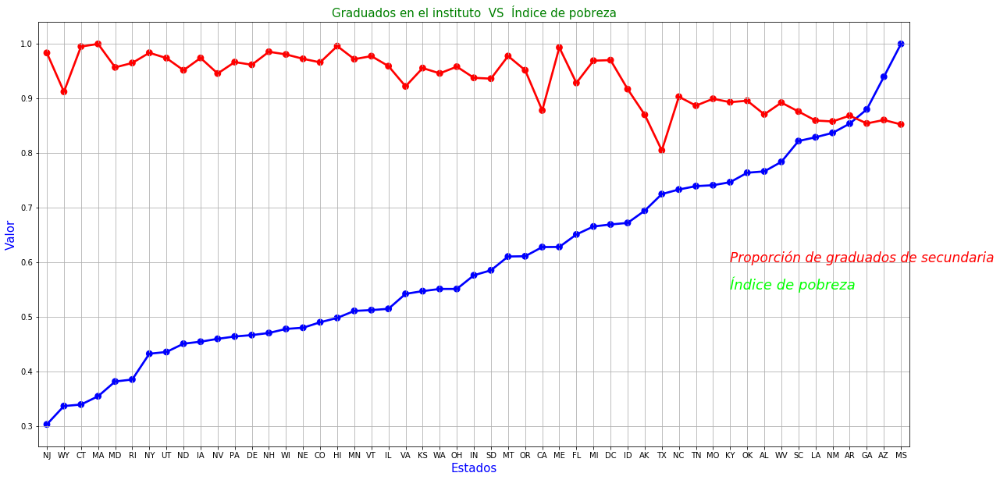

In [34]:
f,ax1 = plt.subplots(figsize =(20,10))
sns.pointplot(x='area_list',y='area_poverty_ratio',data=data,color='blue',alpha=0.8)
sns.pointplot(x='area_list',y='area_highschool_ratio',data=data,color='red',alpha=0.8)
plt.text(40,0.6,'Proporción de graduados de secundaria',color='red',fontsize = 17,style = 'italic')
plt.text(40,0.55,'Índice de pobreza',color='lime',fontsize = 18,style = 'italic')
plt.xlabel('Estados',fontsize = 15,color='blue')
plt.ylabel('Valor',fontsize = 15,color='blue')
plt.title('Graduados en el instituto  VS  Índice de pobreza',fontsize = 15,color='green')
plt.grid()

## Joint Plot

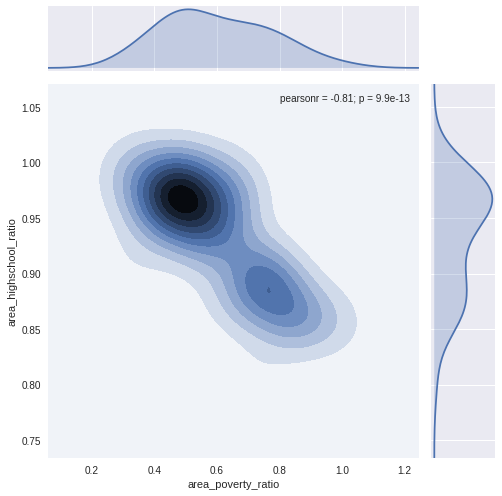

In [10]:
g = sns.jointplot(data.area_poverty_ratio, data.area_highschool_ratio, kind="kde", size=7)
plt.savefig('graph.png')
plt.show()

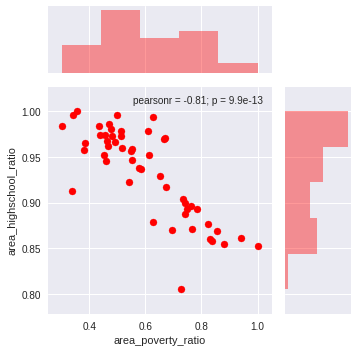

In [11]:
g = sns.jointplot("area_poverty_ratio", "area_highschool_ratio", data=data,size=5, ratio=3, color="r")

# Ejercicios

Realizar un jointplot de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico circular

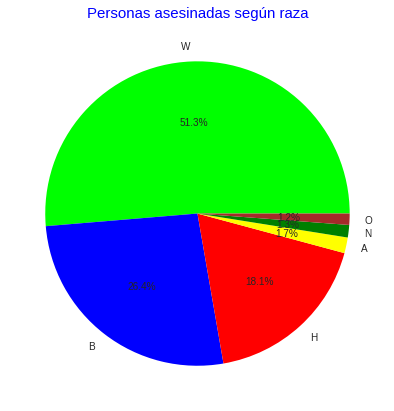

In [12]:
kill.race.dropna(inplace=True)
labels = kill.race.value_counts().index
colors = ['lime','blue','red','yellow','green','brown']
explode = [0,0,0,0,0,0]
sizes = kill.race.value_counts().values

plt.figure(figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Personas asesinadas según raza',color = 'blue',fontsize = 15);

# Ejercicios

Realizar un gráfico circular de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico KDE

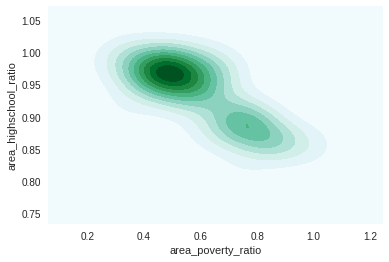

In [13]:
sns.kdeplot(data.area_poverty_ratio, data.area_highschool_ratio, shade=True, cut=3)
plt.show()

## Gráfico de violin

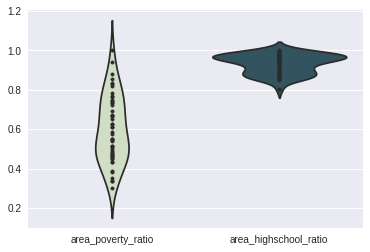

In [14]:
pal = sns.cubehelix_palette(2, rot=-.5, dark=.3)
sns.violinplot(data=data, palette=pal, inner="points")
plt.show();

## Mapa de calor

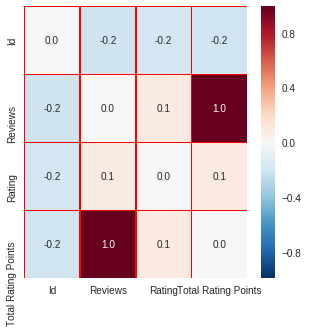

In [15]:
corr = app.corr()
np.fill_diagonal(corr.values, 0)
f,ax = plt.subplots(figsize=(5, 5))
sns.heatmap(corr, annot=True, linewidths=0.5,linecolor="red", fmt= '.1f',ax=ax)
plt.show()

# Ejercicios

Realizar un mapa de calor de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico de cajas

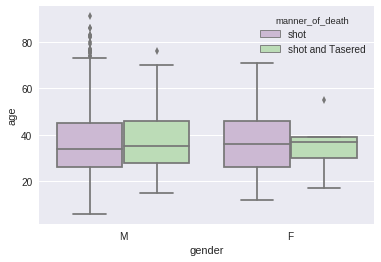

In [16]:
sns.boxplot(x="gender", y="age", hue="manner_of_death", data=kill, palette="PRGn")
plt.show()

## Swarm Plot(Gráfico de enjambre)

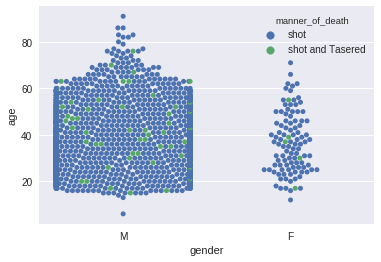

In [17]:
sns.swarmplot(x="gender", y="age",hue="manner_of_death", data=kill)
plt.show()

## Múltiples gráficas de dispersión

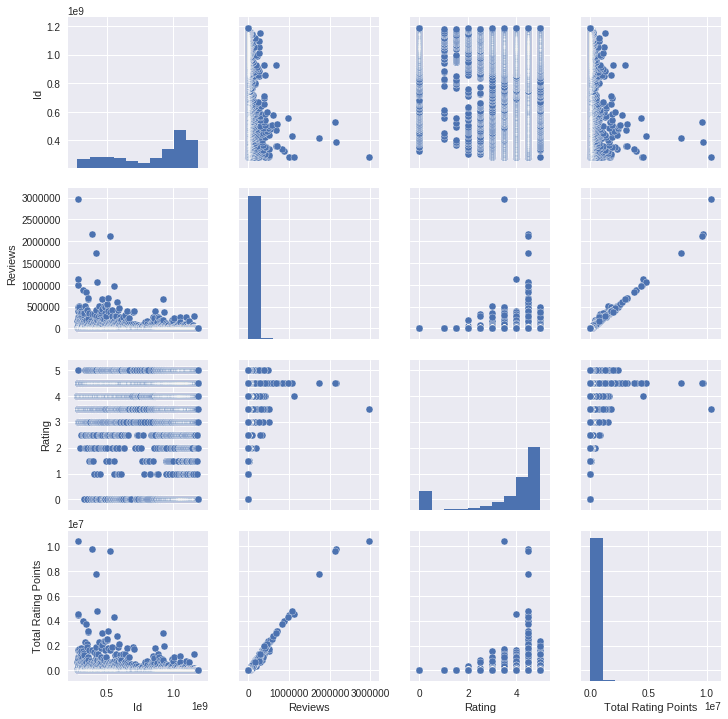

In [18]:
sns.pairplot(app)
plt.show()

# Ejercicios

Realizar múltiples gráficas de dispersión de cualquier dataframe. Mínimo 4 columnas

In [ ]:
# Escriba su código aquí

# Plotly

## Gráfico de línea
* **trazas**
    * **x** : Eje x
    * **y**: Eje y 
    * **mode**: Tipo de trama
    * **name**: Nombre
    * **marker**:  Diccionario 
        * **color**: Color de las líneas. RGBA
    * **text**: Texto al hacer hover
* **data**: Lista que incluye nuestras trazas
* **layout**: Diccionario.
    * **title**: title of layout
    * **xaxis**: it is dictionary
        * **title**: Nombre del eje X
        * **ticklen**: Longitud del eje X
        * **zeroline**: Mostrar la línea de 0
* **fig**: Diccionario que incluye el layout y los datos

In [3]:
#configure_plotly_browser_state()
df = timesData.iloc[:100,:]

trace1 = go.Scatter(
                    x = df.world_rank,
                    y = df.citations,
                    mode = "lines",
                    name = "citaciones",
                    marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                    text= df.university_name)
trace2 = go.Scatter(
                    x = df.world_rank,
                    y = df.teaching,
                    mode = "lines+markers",
                    name = "enseñanza",
                    marker = dict(color = 'rgba(80, 26, 80, 0.8)'),
                    text= df.university_name)
data = [trace1, trace2]
layout = dict(title = 'Citas y Enseñanza vs Top 100 universidades',
              xaxis= dict(title= 'Ranking mundial',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)

In [4]:
iplot(fig)

## Gráfico de dispersión


In [5]:
df2014 = timesData[timesData.year == 2014].iloc[:100,:]
df2015 = timesData[timesData.year == 2015].iloc[:100,:]
df2016 = timesData[timesData.year == 2016].iloc[:100,:]

In [6]:
trace1 =go.Scatter(
                    x = df2014.world_rank,
                    y = df2014.citations,
                    mode = "markers",
                    name = "2014",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    text= df2014.university_name)

trace2 =go.Scatter(
                    x = df2015.world_rank,
                    y = df2015.citations,
                    mode = "markers",
                    name = "2015",
                    marker = dict(color = 'rgba(255, 128, 2, 0.8)'),
                    text= df2015.university_name)

trace3 =go.Scatter(
                    x = df2016.world_rank,
                    y = df2016.citations,
                    mode = "markers",
                    name = "2016",
                    marker = dict(color = 'rgba(0, 255, 200, 0.8)'),
                    text= df2016.university_name)

In [7]:
data = [trace1, trace2, trace3]
layout = dict(title = 'Citaciones vs Ranking mundial de universidades en 2014, 2015 y 2016',
              xaxis= dict(title= 'Ranking',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Citación',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)

In [8]:
#configure_plotly_browser_state()
iplot(fig)

# Ejercicios

Realizar un gráfico de dispersión de cualquier dataframe

In [9]:
# Escriba su código aquí

## Gráfico de barras

* **layout**: Diccionario
    * **barmode**: Modo de las barras

In [10]:
df2014 = timesData[timesData.year == 2014].iloc[:3,:]
trace1 = go.Bar(
                x = df2014.university_name,
                y = df2014.citations,
                name = "Citaciones",
                marker = dict(color = 'rgba(100, 80, 255, 0.5)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df2014.country)
trace2 = go.Bar(
                x = df2014.university_name,
                y = df2014.teaching,
                name = "Enseñanza",
                marker = dict(color = 'rgba(205, 188, 128, 0.5)',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df2014.country)
data = [trace1, trace2]
layout = go.Layout(barmode = "group")
fig = go.Figure(data = data, layout = layout)

In [11]:
#configure_plotly_browser_state()
iplot(fig)

In [12]:
df2014 = timesData[timesData.year == 2014].iloc[:3,:]
import plotly.graph_objs as go

x = df2014.university_name

trace1 = {
  'x': x,
  'y': df2014.citations,
  'name': 'Citación',
  'type': 'bar'
};
trace2 = {
  'x': x,
  'y': df2014.teaching,
  'name': 'Enseñanza',
  'type': 'bar'
};

In [13]:
data = [trace1, trace2];
layout = {
  'xaxis': {'title': 'Top 3 universidades'},
  'barmode': 'relative',
  'title': 'Citaciones y enseñanza en las 3 mejores universidades en 2014'
};
fig = go.Figure(data = data, layout = layout)

In [14]:
#configure_plotly_browser_state()
iplot(fig)

# Ejercicios

Realizar un gráfico de barras de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico circular
* **fig**:
    * **data**:
        * **values**: Valores
        * **labels**: Etiquetas
        * **name**: Nombres
        * **hoverinfo**: Texto en el hover
        * **hole**: Ancho del círculo interior
        * **type**: Tipo
    * **layout**:
        * **title**: Título
        * **annotations**: Diccionario
           * **font**: Fuente
           * **showarrow**: Mostrar flechas
           * **text**: Texto
           * **x**
           * **y**

In [15]:
df2016 = timesData[timesData.year == 2016].iloc[:7,:]
pie1 = df2016.num_students
pie1_list = [float(each.replace(',', '.')) for each in df2016.num_students]  # str(2,4) => str(2.4) = > float(2.4) = 2.4
labels = df2016.university_name
fig = {
  "data": [
    {
      "values": pie1_list,
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "Porcentaje de estudiantes",
      "hoverinfo":"label+percent+name",
      "hole": .1,
      "type": "pie"
    },],
  "layout": {
        "title":"Porcentaje de estudiantes",
        "annotations": [
            { "font": { "size": 20},
              "showarrow": False,
              "text": "",
              "x": 0.20,
              "y": 1
            },
        ]
    }
}

In [16]:
#configure_plotly_browser_state()
iplot(fig)

# Ejercicios

Realizar un pie chart de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Gráfico de burbujas
* **mode**: markers(scatter)
*  **marker**: Diccionario
    * **color**: Tercera medición de la gráfica
    * **size**: Cuarta medición de la gráfica
* **text**: Nombres de las universidades

In [17]:
df2016 = timesData[timesData.year == 2016].iloc[:20,:]
num_students_size  = [float(each.replace(',', '.')) for each in df2016.num_students]
international_color = [float(each) for each in df2016.international]
data = [
    {
        'y': df2016.teaching,
        'x': df2016.world_rank,
        'mode': 'markers',
        'marker': {
            'color': international_color,
            'size': num_students_size,
            'showscale': True
        },
        "text" :  df2016.university_name    
    }
]

In [18]:
#configure_plotly_browser_state()
iplot(data)

# Ejercicios

Realizar un gráfico de burbujas de cualquier dataframe

In [ ]:
# Escriba su código aquí

## Histograma
* **layout**: Diccionario
    * **barmode**: stack o overlay

In [19]:
x2011 = timesData.student_staff_ratio[timesData.year == 2011]
x2012 = timesData.student_staff_ratio[timesData.year == 2012]

trace1 = go.Histogram(
    x=x2011,
    opacity=0.75,
    name = "2011",
    marker=dict(color='rgba(171, 50, 96, 0.6)'))
trace2 = go.Histogram(
    x=x2012,
    opacity=0.75,
    name = "2012",
    marker=dict(color='rgba(12, 50, 196, 0.6)'))

data = [trace1, trace2]
layout = go.Layout(barmode='stack',
                   title=' Proproción estudiantes/personal en 2011 y 2012',
                   xaxis=dict(title='Proporción estudiantes/personal'),
                   yaxis=dict( title='Valor'),
)
fig = go.Figure(data=data, layout=layout)

In [20]:
#configure_plotly_browser_state()
iplot(fig)

# Ejercicios

Realizar un histograma de cualquier dataframe

In [21]:
# Escriba su código aquí

## Gráfico de cajas

In [22]:
x2015 = timesData[timesData.year == 2015]

trace0 = go.Box(
    y=x2015.total_score,
    name = 'Puntuación total en el ranking de universidades en 2015',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)
trace1 = go.Box(
    y=x2015.research,
    name = 'Investigación en universidades en 2015',
    marker = dict(
        color = 'rgb(12, 128, 128)',
    )
)
data = [trace0, trace1]

In [23]:
#configure_plotly_browser_state()
iplot(data)


## Múltiples gráficos de dispersión

In [24]:
import plotly.figure_factory as ff

dataframe = timesData[timesData.year == 2015]
data2015 = dataframe.loc[:,["research","international", "total_score"]]
data2015["index"] = np.arange(1,len(data2015)+1)

fig = ff.create_scatterplotmatrix(data2015, diag='box', index='index',colormap='Portland',
                                  colormap_type='cat',
                                  height=700, width=700)

In [25]:
#configure_plotly_browser_state()
iplot(fig)

## Inset Plots


In [26]:
trace1 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.teaching,
    name = "enseñanza",
    marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
)

trace2 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.income,
    xaxis='x2',
    yaxis='y2',
    name = "ingresos",
    marker = dict(color = 'rgba(160, 112, 20, 0.8)'),
)

In [27]:
data = [trace1, trace2]
layout = go.Layout(
    xaxis2=dict(
        domain=[0.6, 0.95],
        anchor='y2',        
    ),
    yaxis2=dict(
        domain=[0.6, 0.95],
        anchor='x2',
    ),
    title = 'Ingresos y enseñanza vs Ranking mundial de universidades'

)

fig = go.Figure(data=data, layout=layout)

In [28]:
#configure_plotly_browser_state()
iplot(fig)

## Gráfico de dispersión 3D
* **x,y,z**: Ejes
* **mode**: Marker
* **size**: Tamaño
* **color**: Eje de la escala de color
* **colorscale**:  Cuarta medición

In [29]:
trace1 = go.Scatter3d(
    x=dataframe.world_rank,
    y=dataframe.research,
    z=dataframe.citations,
    mode='markers',
    marker=dict(
        size=10,
        color='rgb(255,0,0)',     
    )
)

data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0  
    )
    
)
fig = go.Figure(data=data, layout=layout)

In [30]:
#configure_plotly_browser_state()
iplot(fig)

## Múltiples gráficas



In [31]:
trace1 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.research,
    name = "investigación"
)
trace2 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.citations,
    xaxis='x2',
    yaxis='y2',
    name = "citaciones"
)
trace3 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.income,
    xaxis='x3',
    yaxis='y3',
    name = "ingresos"
)
trace4 = go.Scatter(
    x=dataframe.world_rank,
    y=dataframe.total_score,
    xaxis='x4',
    yaxis='y4',
    name = "puntuación total"
)

In [32]:
data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    xaxis=dict(
        domain=[0, 0.45]
    ),
    yaxis=dict(
        domain=[0, 0.45]
    ),
    xaxis2=dict(
        domain=[0.55, 1]
    ),
    xaxis3=dict(
        domain=[0, 0.45],
        anchor='y3'
    ),
    xaxis4=dict(
        domain=[0.55, 1],
        anchor='y4'
    ),
    yaxis2=dict(
        domain=[0, 0.45],
        anchor='x2'
    ),
    yaxis3=dict(
        domain=[0.55, 1]
    ),
    yaxis4=dict(
        domain=[0.55, 1],
        anchor='x4'
    ),
    title = 'Investigación, citaciones, ingresos y puntuación total VS Ranking mundial de universidades'
)

In [33]:
#configure_plotly_browser_state()
fig = go.Figure(data=data, layout=layout)
iplot(fig)

## Mapas Geográficos

In [34]:
for col in geo_data.columns:
    geo_data[col] = geo_data[col].astype(str)

scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

geo_data['text'] = geo_data['state'] + '<br>' +\
    'Beef '+geo_data['beef']+' Dairy '+geo_data['dairy']+'<br>'+\
    'Fruits '+geo_data['total fruits']+' Veggies ' + geo_data['total veggies']+'<br>'+\
    'Wheat '+geo_data['wheat']+' Corn '+geo_data['corn']

In [35]:
data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = geo_data['code'],
        z = geo_data['total exports'].astype(float),
        locationmode = 'USA-states',
        text = geo_data['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Millions USD")
        ) ]

In [36]:
layout = dict(
        title = 'Exportaciones agrícolas por estado en USA en 2011',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )

In [37]:
#configure_plotly_browser_state()
fig = dict( data=data, layout=layout )
iplot( fig, filename='d3-cloropleth-map' )

In [38]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')

data = [ dict(
        type = 'choropleth',
        locations = df['CODE'],
        z = df['GDP (BILLIONS)'],
        text = df['COUNTRY'],
        colorscale = [[0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
            [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"]],
        autocolorscale = False,
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar = dict(
            autotick = False,
            tickprefix = '$',
            title = 'Billones US$'),
      ) ]

In [39]:
layout = dict(
    title = 'Producto mundial bruto en 2014<br>Fuente:\
            <a href="https://www.cia.gov/library/publications/the-world-factbook/fields/2195.html">\
            CIA World Factbook</a>',
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'Mercator'
        )
    )
)

fig = dict( data=data, layout=layout )

In [40]:
#configure_plotly_browser_state()
iplot( fig, validate=False, filename='d3-world-map' )

In [41]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_ebola.csv')
df.head()

cases = []
colors = ['rgb(239,243,255)','rgb(189,215,231)','rgb(107,174,214)','rgb(33,113,181)']
months = {6:'June',7:'July',8:'Aug',9:'Sept'}

for i in range(6,10)[::-1]:
    cases.append(go.Scattergeo(
        lon = df[ df['Month'] == i ]['Lon'],
        lat = df[ df['Month'] == i ]['Lat'],
        text = df[ df['Month'] == i ]['Value'],
        name = months[i],
        marker = dict(
            size = df[ df['Month'] == i ]['Value']/50,
            color = colors[i-6],
            line = dict(width = 0)
        ),
    ) )

cases[0]['text'] = df[ df['Month'] == 9 ]['Value'].map('{:.0f}'.format).astype(str)+' '+\
    df[ df['Month'] == 9 ]['Country']
cases[0]['mode'] = 'markers+text'
cases[0]['textposition'] = 'bottom center'

In [42]:
inset = [
    go.Choropleth(
        locationmode = 'country names',
        locations = df[ df['Month'] == 9 ]['Country'],
        z = df[ df['Month'] == 9 ]['Value'],
        text = df[ df['Month'] == 9 ]['Country'],
        colorscale = [[0,'rgb(0, 0, 0)'],[1,'rgb(0, 0, 0)']],
        autocolorscale = False,
        showscale = False,
        geo = 'geo2'
    ),
    go.Scattergeo(
        lon = [21.0936],
        lat = [7.1881],
        text = ['Africa'],
        mode = 'text',
        showlegend = False,
        geo = 'geo2'
    )
]


In [43]:
layout = go.Layout(
    title = 'Casos de Ébola en el oeste de África en el 2014<br> \
Fuente: <a href="https://data.hdx.rwlabs.org/dataset/rowca-ebola-cases">\
HDX</a>',
    geo = dict(
        resolution = 50,
        scope = 'africa',
        showframe = False,
        showcoastlines = True,
        showland = True,
        landcolor = "rgb(229, 229, 229)",
        countrycolor = "rgb(255, 255, 255)" ,
        coastlinecolor = "rgb(255, 255, 255)",
        projection = dict(
            type = 'mercator'
        ),
        lonaxis = dict( range= [ -15.0, -5.0 ] ),
        lataxis = dict( range= [ 0.0, 12.0 ] ),
        domain = dict(
            x = [ 0, 1 ],
            y = [ 0, 1 ]
        )
    ),
    geo2 = dict(
        scope = 'africa',
        showframe = False,
        showland = True,
        landcolor = "rgb(229, 229, 229)",
        showcountries = False,
        domain = dict(
            x = [ 0, 0.6 ],
            y = [ 0, 0.6 ]
        ),
        bgcolor = 'rgba(255, 255, 255, 0.0)',
    ),
    legend = dict(
           traceorder = 'reversed'
    )
)

In [44]:
#configure_plotly_browser_state()
fig = go.Figure(layout=layout, data=cases+inset)
iplot(fig, validate=False, filename='West Africa Ebola cases 2014')

In [ ]:
# Necesario para poder mostrar la gráfica
!pip install geopandas==0.3.0
!pip install pyshp==1.2.10
!pip install shapely==1.6.3

In [45]:
df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/laucnty16.csv')
df_sample['State FIPS Code'] = df_sample['State FIPS Code'].apply(lambda x: str(x).zfill(2))
df_sample['County FIPS Code'] = df_sample['County FIPS Code'].apply(lambda x: str(x).zfill(3))
df_sample['FIPS'] = df_sample['State FIPS Code'] + df_sample['County FIPS Code']

colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
              "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
              "#08519c","#0b4083","#08306b"]
endpts = list(np.linspace(1, 12, len(colorscale) - 1))
fips = df_sample['FIPS'].tolist()
values = df_sample['Unemployment Rate (%)'].tolist()

fig = ff.create_choropleth(
    fips=fips, values=values, scope=['usa'],
    binning_endpoints=endpts, colorscale=colorscale,
    show_state_data=False,
    show_hover=True, centroid_marker={'opacity': 0},
    asp=2.9, title='Desempleo en USA %',
    legend_title='Porcentaje desempleados'
)

In [46]:
#configure_plotly_browser_state()
iplot(fig, filename='choropleth_full_usa')

# Ejercicios

Realiza un EDA(Exploratory Data Analysis) con cualquier dataframe